<a href="https://colab.research.google.com/github/eolus87/Coursera_Capstone/blob/master/The_battle_of_neighborhoods_in_San_Jose.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# The Battle of Neighborhoods - 'San José' (California, USA)
This project is developed as the final assignment of the course: ["Applied Data Science Capstone"](https://www.coursera.org/learn/applied-data-science-capstone) on online learning platform [Coursera](www.coursera.org), inside the [Professional certificate of Data Science from IBM](https://www.coursera.org/professional-certificates/ibm-data-science).


Nicolás Gutiérrez,  
UK, 20th of May of 2020




---


## Introduction

### Description of the problem and a discussion of the background
There is an important investment company interested in the city of San José (California). San José is called the capital of the silicon valley. This region is a hot point respect to technology development, with companies like Apple, Google or Tesla between many others installed there. Many of the inhabitants of San José are engineers from these companies with high purchasing power. Additionally, the city is believed to be increasing its population and the average purchashing power of their citizens.  
Our client investment company is interested in opening different types of businesses there, but mainly the ones related with services like restaurants, coffee shops, gyms and hotels.   
As Data Scientists, we have been asked to develop a study of San Jose, in order to select the best neighbours to possibly locate the businesses mentioned before.  
This study will be the very first step in studying the viability of the project.

### Description of the data and how it will be used to solve the problem
First, an investigation about San José will be developed, mainly focused on: the neighborhoods of the city, the districts used by their government, population and any other relevant data. Two websites have been identified to contain these data "[www.sanjose.org/neighborhoods](www.sanjose.org/neighborhoods)" and "[https://www.sanjoseca.gov/](https://www.sanjoseca.gov/)".    
Once the information from those sources has been retrieved, some geocoding services (OpenCage for example) will be used and coordinates operations will be developed to wrangle the data.  
Next, the full area will be divided using a mesh and a matrix of small regions will be introduced into Foursquare API to explore the venues. The full list of venues will be cleaned and grouped as per our client requires.  
Clustering will be used to group the districts of San José based on population and venues. The information will be presented mainly on maps based on Folium API.


### Installation of packages,and importing libraries

In [9]:
!pip install opencage
!pip install kml2geojson
!pip install geopandas

In [10]:
# Libraries for general use: data analysis, treatment, transformation, filtering
import pandas as pd
import re
import numpy as np
import json
from pandas.io.json import json_normalize

# Libraries for data representation
import folium # map rendering library
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from yellowbrick.cluster import KElbowVisualizer

# Libraries for http requests and html dealing
import urllib.request
from bs4 import BeautifulSoup
from pprint import pprint
import requests

# Libraries for geocoding/geoservices
from opencage.geocoder import OpenCageGeocode
import kml2geojson
import geopandas as gpd
from shapely.geometry import Polygon

# Libraries for machine learning
from sklearn.cluster import KMeans

print("Libraries needed imported!")

Libraries needed imported!


In [0]:
# Folium color styles
# source: https://github.com/python-visualization/folium/blob/v0.2.0/folium/utilities.py#L104
fillcolorpalette = ['BuGn','BuPu','GnBu','OrRd','PuBu','PuBuGn','PuRd','RdPu',
                   'YlGn','YlGnBu','YlOrBr','YlOrRd','BrBg','PiYG','PRGn','PuOr',
                   'RdBu','RdGy','RdYlBu','RdYlGn','Spectral','Accent','Dark2',
                   'Paired','Pastel1','Pastel2','Set1','Set2','Set3']

marker_colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred',
                'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue',
                'darkpurple', 'pink', 'lightblue', 'lightgreen',
                'gray', 'black', 'lightgray']

In [0]:
# This cell contains private data
# Opencage API details. 
opencage_APIkey   = 'XXX'

# foursquare details
foursquare_id     = 'XXX'
foursquare_secret = 'XXX'
VERSION           = '20180605' # Foursquare API version



---


## Data I: Geographic and Population 

### San José neighborhoods list and coordinates

The list of neighborhoods of San José is obtained through web scraping [www.sanjose.org]("https://www.sanjose.org/neighborhoods"). First HTML code is extracted.

In [0]:
# The following URL wil be parsed to extract the name of the different neighborhoods
url  = "https://www.sanjose.org/neighborhoods"
page =  urllib.request.urlopen(url)

# Now it is the turn of Beautiful Soup to parse the HTML code we got
soup = BeautifulSoup(page, "lxml")
# print(soup.prettify())

Then, regular expressions are used to find fields with neighborhood-- pattern observed in the HTML code.

In [14]:
# Regular expressions are used to parse automatically the name of the neighborhoods 
neighborhoods = re.findall('id="neighborhood--(\D{,15})"', str(soup))
for i in range(len(neighborhoods)):
  neighborhoods[i] = neighborhoods[i].replace('-',' ')

# According the previous url, there are 18 neighborhoods in San Jose
print(neighborhoods)
print("Number of neighborhoods detected is {}".format(len(neighborhoods)))

['north san jose', 'alviso', 'alum rock', 'little portugal', 'mayfair', 'japantown', 'naglee park', 'downtown', 'little italy', 'the alameda', 'rose garden', 'west san jose', 'santana row', 'willow glen', 'little saigon', 'south san jose', 'evergreen', 'almaden valley']
Number of neighborhoods detected is 18


Once the name of the neighborhoods are known, a [geocoder service](https://opencagedata.com/) is used to obtain the coordinates of all of them.

In [15]:
# Create the instace of gecoder
geocoder = OpenCageGeocode(opencage_APIkey)

# Initialization of neighborhoods latitude and longitude vectors
latitude  = np.zeros(len(neighborhoods))
longitude = np.zeros(len(neighborhoods))

# Retrieve the coordinates of all neighbourhoods
for i in range(len(neighborhoods)):
  query        = u'{} San Jose, CA, USA'.format(neighborhoods[i])
  results      = geocoder.geocode(query)
  latitude[i]  = results[0]['geometry']['lat']
  longitude[i] = results[0]['geometry']['lng']

print('Vector of Latitude:  {}'.format(latitude))
print('Vector of Longitude: {}'.format(longitude))

Vector of Latitude:  [37.285983  37.426051  37.3660513 37.3509187 35.3363483 37.3489602
 37.3384015 37.3359104 37.3359545 37.3316503 37.3339826 37.353513
 37.3209172 37.281282  37.3311452 37.206897  37.3096638 37.2216072]
Vector of Longitude: [-121.747894  -121.9752373 -121.8271756 -121.8649108 -118.9142653
 -121.8942303 -121.874715  -121.8910758 -121.8986639 -121.9096123
 -121.9240708 -121.867451  -121.9481582 -121.8892848 -121.8560176
 -121.843767  -121.7835622 -121.8617567]


Creation of the DataFrame with the name of the neighborhoods and their coordinates

In [16]:
neigh_df = pd.DataFrame({'Name':neighborhoods, 'latitude':latitude, 'longitude':longitude})
neigh_df

,Name,latitude,longitude
0,north san jose,37.285983,-121.747894
1,alviso,37.426051,-121.975237
2,alum rock,37.366051,-121.827176
3,little portugal,37.350919,-121.864911
4,mayfair,35.336348,-118.914265
5,japantown,37.348960,-121.894230
6,naglee park,37.338402,-121.874715
7,downtown,37.335910,-121.891076
8,little italy,37.335954,-121.898664
9,the alameda,37.331650,-121.909612


Some of the coordinates from the geocoder were wrong, so a manual correction was needed afterwards. Different sources are used to doublecheck those coordinates.

In [17]:
# Some postions are incorrect, so needed to correct them manually:
neigh_df.at[0,'latitude']       = 37.38965
neigh_df.at[0,'longitude']      = -121.93024
neigh_df.at[4,'latitude']       = 37.34872
neigh_df.at[4,'longitude']      = -121.84630
neigh_df.at[11,'latitude']      = 37.30199
neigh_df.at[11,'longitude']     = -121.99698
neigh_df.at[13,'latitude']      = 37.30357
neigh_df.at[13,'longitude']     = -121.897345
neigh_df.at[15,'latitude']      = 37.238635
neigh_df.at[15,'longitude']     = -121.838336

neigh_df

,Name,latitude,longitude
0,north san jose,37.389650,-121.930240
1,alviso,37.426051,-121.975237
2,alum rock,37.366051,-121.827176
3,little portugal,37.350919,-121.864911
4,mayfair,37.348720,-121.846300
5,japantown,37.348960,-121.894230
6,naglee park,37.338402,-121.874715
7,downtown,37.335910,-121.891076
8,little italy,37.335954,-121.898664
9,the alameda,37.331650,-121.909612


San José are calculated as well as an average of the coordinates of all neighborhoods. This information will be used when plotting the information in a folium map.

In [18]:
# Latitude and Longitude of San Jose are calculated meaning the coordinates of all their neighborhoods
latmanualcorrection  = -0.029
longmanualcorrection = -0.05
lat_sanjose  = neigh_df['latitude'].mean()+latmanualcorrection
long_sanjose = neigh_df['longitude'].mean()+longmanualcorrection
print('The geograpical coordinates of San Jose are {}, {}.'.format(lat_sanjose, long_sanjose))

The geograpical coordinates of San Jose are 37.30065438333333, -121.93991041666668.


In [0]:
# Saving the sanjoseneighborhoods data into a csv, in case it is needed for the future
neigh_df.to_csv('sanjoseneighborhoods.csv')

### San José districts list, data and coordinates
Apart from the neighborhoods, from the [website of the government of San José](https://www.sanjoseca.gov), the information about their districts is retrieved. 

In [0]:
# Downloading the district coordinates boundaries of the different districts of San José from their city counsil website
!wget -o log.txt -O sanjosedistricts.zip https://www.sanjoseca.gov/home/showdocument?id=37995

In [21]:
# Unzipping the data
!unzip sanjosedistricts.zip -d sanjosedisctricts
!unzip /content/sanjosedisctricts/CITY_COUNCIL_DISTRICTS.kmz

Archive:  sanjosedistricts.zip
  inflating: sanjosedisctricts/CITY_COUNCIL_DISTRICTS.dbf  
  inflating: sanjosedisctricts/CITY_COUNCIL_DISTRICTS.kmz  
  inflating: sanjosedisctricts/CITY_COUNCIL_DISTRICTS.prj  
  inflating: sanjosedisctricts/CITY_COUNCIL_DISTRICTS.shp  
  inflating: sanjosedisctricts/CITY_COUNCIL_DISTRICTS.shx  
Archive:  /content/sanjosedisctricts/CITY_COUNCIL_DISTRICTS.kmz
  inflating: doc.kml                 


Now the data is transformed into geojson and analysed.

In [0]:
# Converting from kml to geojson because folium need geojson format
kml2geojson.main.convert('doc.kml', '')

In [0]:
# Opening the geojson file to extract metadata from it
with open('doc.geojson') as json_file:
    sanjosecouncildata = json.load(json_file)

In [0]:
# Going through the geojson data to extract population, housing units and square miles, and also calculating some other features like:
# - Population density as population per square mile
# - Population per house
# - Average latitude
# - Average longitude

n_of_districts = len(sanjosecouncildata['features'])

# Data from the data set
population    = []
housing_units = []
square_miles  = []
district_text = []
number        = []
# Calculated magnitudes
pop_density   = []
pop_per_house = []
center_lat    = []
center_long   = []
 
# Loop to go through all districts
for i in range(n_of_districts):
  population.append(np.int(sanjosecouncildata['features'][i]['properties']['POPULATION']))
  housing_units.append(np.int(sanjosecouncildata['features'][i]['properties']['HOUSING_UNITS']))
  square_miles.append(np.float(sanjosecouncildata['features'][i]['properties']['CCDISTAREA']))
  district_text.append(sanjosecouncildata['features'][i]['properties']['DISTRICT'])
  number.append(np.int(district_text[-1]))
  pop_density.append(population[-1]/square_miles[-1])
  pop_per_house.append(population[-1]/housing_units[-1])
  center_lat.append((np.array([item[1] for item in sanjosecouncildata['features'][i]['geometry']['coordinates'][0]]).mean()))
  center_long.append((np.array([item[0] for item in sanjosecouncildata['features'][i]['geometry']['coordinates'][0]]).mean()))

Creating and saving a dataframe with the data

In [25]:
# Creation of the DataFrame
councils_data = pd.DataFrame({'district'      : district_text,
                              'number'        : number,
                              'population'    : population, 
                              'housing_units' : housing_units, 
                              'square_miles'  : square_miles, 
                              'pop_density'   : pop_density, 
                              'pop_per_house' : pop_per_house,
                              'center_lat'    : center_lat,
                              'center_long'   : center_long})

# Sorting the DataFrame
councils_data.sort_values(by=['number'], inplace=True, ignore_index=True)
# Saving and showing the DataFrame
councils_data.to_csv('councils_data.csv')
print('San José has a population of {} inhabitants and covers an area of {} m^2'.format(councils_data['population'].sum(),councils_data['square_miles'].sum()))
councils_data

San José has a population of 952612 inhabitants and covers an area of 279.96000000000004 m^2


,district,number,population,housing_units,square_miles,pop_density,pop_per_house,center_lat,center_long
0,1,1,95817,36182,9.72,9857.716049,2.648195,37.296437,-121.985280
1,2,2,91379,28681,43.54,2098.736794,3.186047,37.246494,-121.775911
2,3,3,97003,34021,13.05,7433.180077,2.851268,37.355579,-121.894108
3,4,4,99892,33047,40.62,2459.182669,3.022725,37.410730,-121.881324
4,5,5,97510,24263,17.01,5732.510288,4.018876,37.375417,-121.805657
5,6,6,91837,39181,12.22,7515.302782,2.343917,37.307389,-121.916346
6,7,7,99030,26793,11.16,8873.655914,3.696115,37.303184,-121.838462
7,8,8,97336,27363,72.81,1336.849334,3.557212,37.285814,-121.761826
8,9,9,90714,34212,12.49,7262.930344,2.651526,37.258634,-121.910227
9,10,10,92094,32033,47.34,1945.373891,2.874973,37.236517,-121.853606


Plot of the map with the city districts and neighborhoods

In [26]:
# Geografic data of the districts
councils_geo = 'doc.geojson'

# Map for displaying council districts and neighborhoods
map_sanjose2 = folium.Map(location=[lat_sanjose, long_sanjose], zoom_start=10.5)

# Adding the areas with the different districts
folium.Choropleth(
    geo_data=councils_geo,
    name='choropleth',
    data=councils_data,
    columns=['district', 'number'],
    key_on='feature.properties.DISTRICT',
    fill_color=fillcolorpalette[21],
    fill_opacity=0.4,
    line_opacity=1,
    legend_name='District Number'
).add_to(map_sanjose2)

# Adding the text with the number of the districts
for i in range(n_of_districts):
  folium.map.Marker(
      [councils_data['center_lat'][i], councils_data['center_long'][i]],
      icon=folium.features.DivIcon(
          icon_size=(150,36),
          icon_anchor=(10,20),
          html=('<div style="font-size: 24pt">{}</div>'.format(councils_data['district'][i])),
          )
      ).add_to(map_sanjose2)

# Adding markers with the neighborhoods
for i in range(len(neighborhoods)):
  folium.Marker(
      location=[neigh_df['latitude'][i], neigh_df['longitude'][i]],
      popup=neigh_df['Name'][i],
      icon=folium.Icon(color=marker_colors[i])
  ).add_to(map_sanjose2)

# Displaying the map
map_sanjose2

Static map display
<img src="http://drive.google.com/uc?export=view&id=1F071NLNfn6rGW4EXnykUREuUUEurQFPn">

As it can be seen above the information from the neighborhoods is properly distributed around the city, with the district 3 owning many of them. **There is no data about the limits of the neighborhoods either. So from now on this study will focus on districts.**

In [27]:
# Map for displaying population
map_sanjose3 = folium.Map(location=[lat_sanjose, long_sanjose], zoom_start=10.5)

# Adding the areas with the population data
folium.Choropleth(
    geo_data=councils_geo,
    name='choropleth',
    data=councils_data,
    columns=['district', 'population'],
    key_on='feature.properties.DISTRICT',
    fill_color=fillcolorpalette[1],
    fill_opacity=0.6,
    line_opacity=1,
    legend_name='Population'
).add_to(map_sanjose3)

# Plotting the map
map_sanjose3


**Population per district** ranges from 90714 to 99892, thus it is well distributed with differences smaller than 12%. See the map below.

Static map display
<img src="http://drive.google.com/uc?export=view&id=1V6Evr5oJGry9-W87GZyE9ApHPVlNgkAl">

In [28]:
# Map for displaying population density
map_sanjose4 = folium.Map(location=[lat_sanjose, long_sanjose], zoom_start=10.5)

# Adding the areas with the population density data
folium.Choropleth(
    geo_data=councils_geo,
    name='choropleth',
    data=councils_data,
    columns=['district', 'pop_density'],
    key_on='feature.properties.DISTRICT',
    fill_color=fillcolorpalette[2],
    fill_opacity=0.6,
    line_opacity=1,
    legend_name='Population Density [Inhabitants/mile^2]'
).add_to(map_sanjose4)

# Plotting the map
map_sanjose4

As district size is very different, **population density** range is larger than population, with maximum differences of around 700%. Highest population densities can be found in the city centre, specifically in districts:  
1. 1 and 7
2. 3, 6 and 9

Districts 2, 4, 8 and 10 present the lowest population density. 

Static map display
<img src="http://drive.google.com/uc?export=view&id=1Kl_z6RbERFojBTFKOD0mgfBSY_Wu-hVv">

In [29]:
# Map for displaying population density
map_sanjose5 = folium.Map(location=[lat_sanjose, long_sanjose], zoom_start=10.5)

# Adding the areas with Inhabitants per home information
folium.Choropleth(
    geo_data=councils_geo,
    name='choropleth',
    data=councils_data,
    columns=['district', 'pop_per_house'],
    key_on='feature.properties.DISTRICT',
    fill_color=fillcolorpalette[3],
    fill_opacity=0.6,
    line_opacity=1,
    legend_name='Inhabitants per home'
).add_to(map_sanjose5)

# Displaying the map
map_sanjose5

**Inhabitants per home** is an interesting measure to detect families. The maximum average in San José is 4 and can be found in district 5. This is probably the district with the highest number of families.  
From the map, it can be seen that families tend to live in the east side of the city. West side probably has more offices and services.  
Minimum average number of innhabitants per home is 2.3 in district 6.

Static map display
<img src="http://drive.google.com/uc?export=view&id=1rh35yqEjvH4B4bneGvs93GkKk240e2GO">



---


## Data II: Venues
In this section the data will be prepared and segmented before going to Foursquare API and retrieving venues information for every district.

### Auxiliary functions
Three functions are defined first:
- **disbetwenpoints** will allow measuring the distance between two points using their coordinates.
- **pointinpolygon** will confirm if a point is inside a polygon, given the coordinates of both.
- **getNearbyVenues** will help parsing the data from foursquare API.

In [0]:
## Auxiliary functions created to help with the problem
# Distance between points
def distbetweenpoints(A,B):
  # I found the reference for this function here: https://www.movable-type.co.uk/scripts/latlong.html and
  # https://stackoverflow.com/questions/19412462/getting-distance-between-two-points-based-on-latitude-longitude
  
  earthradius = 6373e3
  sigma_1  = np.radians(A[0]) # lat1 to radians
  lambda_1 = np.radians(A[1]) # long1 to radians
  
  sigma_2  = np.radians(B[0]) # lat2 to radians
  lambda_2 = np.radians(B[1]) # long2

  deltasigma  = (sigma_2-sigma_1) # dlat
  deltalambda = (lambda_2-lambda_1) # dlong

  a = np.sin(deltasigma/2)**2 + np.cos(sigma_1)*np.cos(sigma_2)*np.sin(deltalambda/2)**2
  c = 2*np.arctan2(np.sqrt(a),np.sqrt(1-a))
  d = earthradius*c
  return d

# Point in a polygon
def pointinpolygon(point,polygon):
  latpoint  = point[0]
  longpoint = point[1]
  
  havedecided = 0
  c  = 0

  # Check first if the point is inside a bonding box of the polygon
  polygon_lat    = [item[1] for item in polygon]
  polygon_long   = [item[0] for item in polygon]

  polygonmin_lat = np.min(polygon_lat)
  polygonmax_lat  = np.max(polygon_lat)

  polygonmin_long = np.min(polygon_long)
  polygonmax_long  = np.max(polygon_long)

  # Is it in a bounding box?
  if ((latpoint >= polygonmin_lat) and (latpoint <= polygonmax_lat) 
  and (longpoint >= polygonmin_long) and (longpoint <= polygonmax_long)):
    havedecided = 0
  else:
    havedecided = 1
    c  = 0

  # Being in the bounding box is a neccesary condition but not sufficient. The following code has been adapted from 
  # https://stackoverflow.com/questions/217578/how-can-i-determine-whether-a-2d-point-is-within-a-polygon
  if havedecided == 0:
    nvert = len(polygon)
    i = 0
    j = 0
    for i in range(nvert):
      j = i + 1
      if (j==nvert): break
      if (((polygon_lat[i]>latpoint) != (polygon_lat[j]>latpoint)) and
     (longpoint < (polygon_long[j]-polygon_long[i]) * (latpoint-polygon_lat[i]) / (polygon_lat[j]-polygon_lat[i]) + polygon_long[i])):
        if c == 1: c = 0
        else: c = 1

  return c

# getNearbyVenues is a handy function to parse the data obtained from Foursquare API
LIMIT = 200
def getNearbyVenues(district_numbers, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for district_id, lat, lng in zip(district_numbers, latitudes, longitudes):
        # print(district_id)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            foursquare_id, 
            foursquare_secret, 
            VERSION, 
            lat, 
            lng, 
            radius, # Radius is indicated in m
            LIMIT)
            
        # make the GET request
        try:
          results = requests.get(url).json()
          results_filtered = results["response"]['groups'][0]['items']
          
          # return only relevant information for each nearby venue
          if (results["response"]['totalResults'] != 0):
            venues_list.append([(
                district_id, 
                lat, 
                lng, 
                v['venue']['name'], 
                v['venue']['location']['lat'], 
                v['venue']['location']['lng'],  
                v['venue']['categories'][0]['name']) for v in results_filtered])
        except:
              print("Issue with point-> district_id: {}, lat: {}, long: {}".format(district_id,lat,lng))

    if len(venues_list) > 0:
      nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
      nearby_venues.columns = ['District ID', 
                  'Point Latitude', 
                  'Point Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    else:
      nearby_venues = 0

    return(nearby_venues)

### Mesh Creation
Plan from now is finding the bounding box of coordinates from San José and from that point creating a mesh of zones, that will be used later on to retrieve the information from foursquare.

In [31]:
# Initializing coordinates vector
sanjoseminlatvector  = np.zeros(n_of_districts)
sanjosemaxlatvector  = np.zeros(n_of_districts)
sanjoseminlongvector = np.zeros(n_of_districts)
sanjosemaxlongvector = np.zeros(n_of_districts)

# Loop for finding min and max longitude and latitude of all districts
for i in range(n_of_districts):
  sanjoseminlatvector[i]  = np.array([item[1] for item in sanjosecouncildata['features'][i]['geometry']['coordinates'][0]]).min()
  sanjosemaxlatvector[i]  = np.array([item[1] for item in sanjosecouncildata['features'][i]['geometry']['coordinates'][0]]).max()
  sanjoseminlongvector[i] = np.array([item[0] for item in sanjosecouncildata['features'][i]['geometry']['coordinates'][0]]).min()
  sanjosemaxlongvector[i] = np.array([item[0] for item in sanjosecouncildata['features'][i]['geometry']['coordinates'][0]]).max()

# Minimum-Maximum lat-long of San Jose will be the min-max of the districts contained in it 
sanjoseminlat  = np.min(sanjoseminlatvector)
sanjosemaxlat  = np.max(sanjosemaxlatvector)
sanjoseminlong = np.min(sanjoseminlongvector)
sanjosemaxlong = np.max(sanjosemaxlongvector)
print('Districts of San jose can be found between latitudes  {:.5f} and {:.5f} (arc={:.5f})'.format(sanjoseminlat,sanjosemaxlat,sanjosemaxlat-sanjoseminlat))
print('Districts of San jose can be found between longitudes {:.5f} and {:.5f} (arc={:.5f})'.format(sanjoseminlong,sanjosemaxlong,sanjosemaxlong-sanjoseminlong))

maxnorth2south = distbetweenpoints([sanjoseminlat,sanjoseminlong],[sanjosemaxlat,sanjoseminlong])
maxeast2west   = distbetweenpoints([sanjoseminlat,sanjoseminlong],[sanjoseminlat,sanjosemaxlong])
print('This coordinates shape a rectangle with distance N-S of {:.2f} km and E-W of {:.2f} km'.format(maxnorth2south/1000,maxeast2west/1000))

Districts of San jose can be found between latitudes  37.12271 and 37.46921 (arc=0.34650)
Districts of San jose can be found between longitudes -122.04606 and -121.54957 (arc=0.49649)
This coordinates shape a rectangle with distance N-S of 38.54 km and E-W of 44.03 km


In [32]:
# Edges of the bounding box
lat_point_list = [sanjoseminlat, sanjoseminlat, sanjosemaxlat, sanjosemaxlat]
lon_point_list = [sanjoseminlong, sanjosemaxlong, sanjosemaxlong, sanjoseminlong]

# Creation of the Polygon in a format understandable by Folium
polygon_geom = Polygon(zip(lon_point_list, lat_point_list))
crs = {'init': 'epsg:4326'}
polygon = gpd.GeoDataFrame(index=[0], crs=crs, geometry=[polygon_geom])       
print(polygon.geometry)

# Representation of the map
map_sanjose6 = folium.Map([lat_sanjose, long_sanjose], zoom_start=10.5)
folium.GeoJson(polygon).add_to(map_sanjose6)
map_sanjose6

0    POLYGON ((-122.04606 37.12271, -121.54957 37.1...
Name: geometry, dtype: geometry


/usr/local/lib/python3.6/dist-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


Static map display
<img src="http://drive.google.com/uc?export=view&id=11w94w7J9UuvYuh6wp4j47GvNBUTIPin6">

In [33]:
latvector  = np.linspace(sanjoseminlat,sanjosemaxlat,num=40)
longvector = np.arange(sanjoseminlong,sanjosemaxlong,(latvector[1]-latvector[0])*1.255)
print('Mesh has a size of {:.1f} by {:.1f} m'.format(distbetweenpoints([latvector[0],longvector[0]],[latvector[1],longvector[0]]),distbetweenpoints([latvector[0],longvector[0]],[latvector[0],longvector[1]])))

Mesh has a size of 988.2 by 988.9 m


In [34]:
completelatvector  = np.tile(latvector,len(longvector))
completelongvector = np.ones(len(latvector))*longvector[0]
for i in range(1,len(longvector)):
  completelongvector = np.append(completelongvector,np.ones(len(latvector))*longvector[i])

print("Latvector has the following shape {}".format(completelatvector.shape))
print("Longvector has the following shape {}".format(completelongvector.shape))
print("The size of those vectors is the number of tiles of the mesh.")

Latvector has the following shape (1800,)
Longvector has the following shape (1800,)
The size of those vectors is the number of tiles of the mesh.


In [35]:
# Next step is assign the points of the mesh to a district
districtbelonguing = np.ones(len(completelatvector))*99
for i in range(len(completelatvector)):
  for j in range(n_of_districts):
    functionoutput = pointinpolygon([completelatvector[i],completelongvector[i]],sanjosecouncildata['features'][j]['geometry']['coordinates'][0])
    if functionoutput == 1:
      districtbelonguing[i] = np.int(sanjosecouncildata['features'][j]['properties']['DISTRICT'])

print('Number of mesh elements inside a district: {} over {}'.format(len(districtbelonguing[districtbelonguing!=99]),len(districtbelonguing)))

# Filtering the squares that doesn't belong to any district
sanjosemesh = pd.DataFrame({'District_id':districtbelonguing[districtbelonguing!=99], 'Latitude':completelatvector[districtbelonguing!=99], 'Longitude':completelongvector[districtbelonguing!=99]})

Number of mesh elements inside a district: 744 over 1800


In [36]:
# Creation of the map
map_sanjose7 = folium.Map([lat_sanjose, long_sanjose], zoom_start=10.5)

# Adding the bounding box
folium.GeoJson(polygon).add_to(map_sanjose7)

# Adding the districts
folium.Choropleth(
    geo_data=councils_geo,
    name='choropleth',
    data=councils_data,
    columns=['district', 'number'],
    key_on='feature.properties.DISTRICT',
    fill_color=fillcolorpalette[21],
    fill_opacity=0.3,
    line_opacity=0.6,
    legend_name='District Number'
).add_to(map_sanjose7)

# Adding the different regions of the mesh
for lat, lng, pointnumber in zip(sanjosemesh['Latitude'], sanjosemesh['Longitude'], sanjosemesh['District_id']):
    label = 'lat {:.3f}, long {:.3f}'.format(lat,lng)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=6.5,
        popup=label,
        color=marker_colors[np.int(pointnumber)],
        fill=True,
        # fill_color='#3186cc',
        fill_opacity=0.4,
        parse_html=False).add_to(map_sanjose7)

# Plotting the map
map_sanjose7

Static map display
<img src="http://drive.google.com/uc?export=view&id=1xD8DGNgStdcCaFXvKiwZHhbVdZV3K0g-">

### Retrieval, filter and categorise of venues

In [37]:
# Retrieval of the information from FourSquare
sanjosevenues = getNearbyVenues(district_numbers = sanjosemesh['District_id'], 
                                latitudes        = sanjosemesh['Latitude'], 
                                longitudes       = sanjosemesh['Longitude'])
print(sanjosevenues.shape)
sanjosevenues.head()

Issue with point-> district_id: 4.0, lat: 37.451442214867875, long: -122.02375525824662
Issue with point-> district_id: 4.0, lat: 37.41590398013102, long: -121.86765356216499
Issue with point-> district_id: 8.0, lat: 37.34482751065732, long: -121.80075283527286
(3923, 7)


,District ID,Point Latitude,Point Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,1.0,37.300405,-122.023755,Calabazas Park,37.300200,-122.023958,Park
1,1.0,37.300405,-122.023755,Tennis @ Calabazas Park,37.301757,-122.024007,Tennis Court
2,1.0,37.300405,-122.023755,Calabazas BMX Park,37.302385,-122.024999,Bike Trail
3,1.0,37.300405,-122.023755,Health Massage Center,37.296514,-122.023002,Massage Studio
4,1.0,37.309289,-122.023755,TP Tea 茶湯會,37.311208,-122.023676,Bubble Tea Shop


In [38]:
# Filtering the most common types of venues
numberofvenues = 500

listofvenues   = list(((sanjosevenues.groupby('Venue Category').count().sort_values('Venue', ascending = False)).index)[:numberofvenues])
print(listofvenues)

booleantypeofvenues = [False]*len(sanjosevenues)
for i in range(len(sanjosevenues)):
  if sanjosevenues['Venue Category'][i] in listofvenues:
    booleantypeofvenues[i] = True

sanjosevenues_short = sanjosevenues[booleantypeofvenues].copy()

sanjosevenues[booleantypeofvenues]

['Mexican Restaurant', 'Pizza Place', 'Coffee Shop', 'Sandwich Place', 'Vietnamese Restaurant', 'Park', 'Fast Food Restaurant', 'Convenience Store', 'Grocery Store', 'Intersection', 'Gym', 'Chinese Restaurant', 'Playground', 'Gym / Fitness Center', 'Liquor Store', 'Food Truck', 'Bakery', 'Pharmacy', 'Bubble Tea Shop', 'Hotel', 'Clothing Store', 'Bank', 'Cosmetics Shop', 'Café', 'Trail', 'Ice Cream Shop', 'Breakfast Spot', 'Video Store', 'Spa', 'Sushi Restaurant', 'Japanese Restaurant', 'Furniture / Home Store', 'Burger Joint', 'Home Service', 'Shopping Mall', 'Bar', 'Seafood Restaurant', 'Shipping Store', 'Asian Restaurant', 'BBQ Joint', 'Construction & Landscaping', 'Dessert Shop', 'Pet Store', 'Automotive Shop', 'Sporting Goods Shop', 'Restaurant', 'American Restaurant', 'Mobile Phone Shop', 'Gas Station', 'Baseball Field', 'Italian Restaurant', 'Donut Shop', 'Food', 'Pool', 'Salon / Barbershop', 'Fried Chicken Joint', 'Smoke Shop', 'Rental Car Location', 'Business Service', 'Light R

,District ID,Point Latitude,Point Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,1.0,37.300405,-122.023755,Calabazas Park,37.300200,-122.023958,Park
1,1.0,37.300405,-122.023755,Tennis @ Calabazas Park,37.301757,-122.024007,Tennis Court
2,1.0,37.300405,-122.023755,Calabazas BMX Park,37.302385,-122.024999,Bike Trail
3,1.0,37.300405,-122.023755,Health Massage Center,37.296514,-122.023002,Massage Studio
4,1.0,37.309289,-122.023755,TP Tea 茶湯會,37.311208,-122.023676,Bubble Tea Shop
...,...,...,...,...,...,...,...
3918,8.0,37.176021,-121.588901,Verizon,37.172940,-121.592850,Mobile Phone Shop
3919,8.0,37.176021,-121.588901,Verizon,37.172940,-121.592850,Mobile Phone Shop
3920,8.0,37.176021,-121.588901,Verizon,37.172940,-121.592850,Mobile Phone Shop
3921,8.0,37.184905,-121.555450,Henry W. Coe State Park Campsite #6,37.187803,-121.551353,Campground


In [39]:
venuegeneralcategory = []
restaurantskeywords  = ['resta','fast food','food truck','burger','breakfast','bbq','chicken','food','taco','steak','deli','burrito','diner','noodle','chips','salad','bistro',]
healthykeywords      = ['park','golf','trail','pool','gym','fitness','spa','field','sport','athl','massage','dojo','martial','garden','court','tennis','surf','bowl','skate','forest','tennis','soccer','nature']
cafekeywords         = ['cafe','coffee','donut','capcake','café','candy','yogurt','bakery','cafeteria','dessert','cake', 'tea']
hotelkeywords        = ['hotel','resort']
for i in range(len(sanjosevenues)):
  found = 0
  for j in range(len(restaurantskeywords)):
    if (sanjosevenues['Venue Category'][i].lower().find(restaurantskeywords[j]) != -1):
      venuegeneralcategory.append('Restaurant')
      found = 1
      break
  
  if found == 0:
    for j in range(len(healthykeywords)):
      if (sanjosevenues['Venue Category'][i].lower().find(healthykeywords[j]) != -1):
        venuegeneralcategory.append('Sport/Healthy')
        found = 1
        break
  
  if found == 0:
    for j in range(len(cafekeywords)):
      if (sanjosevenues['Venue Category'][i].lower().find(cafekeywords[j]) != -1):
        venuegeneralcategory.append('Cafe/Dessert')
        found = 1
        break

  if found == 0:
    for j in range(len(hotelkeywords)):
      if (sanjosevenues['Venue Category'][i].lower().find(hotelkeywords[j]) != -1):
        venuegeneralcategory.append('Hotel')
        found = 1
        break
  
  if found == 0:
    venuegeneralcategory.append('No category')

print(len(venuegeneralcategory))

3923


In [40]:
sanjosevenues['venue general category'] = venuegeneralcategory
sanjosevenues.head()

,District ID,Point Latitude,Point Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,venue general category
0,1.0,37.300405,-122.023755,Calabazas Park,37.300200,-122.023958,Park,Sport/Healthy
1,1.0,37.300405,-122.023755,Tennis @ Calabazas Park,37.301757,-122.024007,Tennis Court,Sport/Healthy
2,1.0,37.300405,-122.023755,Calabazas BMX Park,37.302385,-122.024999,Bike Trail,Sport/Healthy
3,1.0,37.300405,-122.023755,Health Massage Center,37.296514,-122.023002,Massage Studio,Sport/Healthy
4,1.0,37.309289,-122.023755,TP Tea 茶湯會,37.311208,-122.023676,Bubble Tea Shop,Cafe/Dessert


In [0]:
sanjosevenues.to_csv('sanjosevenues.csv')

In [42]:
# Including the venues information into the councils data DataFrame
# Count for all of the 4 categories previously defined: restaurants, healthy, cafe, hotel
restaurantsnumber = np.zeros(len(councils_data))
healthynumber     = np.zeros(len(councils_data))
coffeenumber      = np.zeros(len(councils_data)) 
hotelnumber       = np.zeros(len(councils_data))

for i in range(len(councils_data)):
  restaurantsnumber[i] = len(sanjosevenues[(sanjosevenues['venue general category']=='Restaurant')    & (sanjosevenues['District ID']==councils_data['number'][i])])
  healthynumber[i]     = len(sanjosevenues[(sanjosevenues['venue general category']=='Sport/Healthy') & (sanjosevenues['District ID']==councils_data['number'][i])])
  coffeenumber[i]      = len(sanjosevenues[(sanjosevenues['venue general category']=='Cafe/Dessert')  & (sanjosevenues['District ID']==councils_data['number'][i])])
  hotelnumber[i]       = len(sanjosevenues[(sanjosevenues['venue general category']=='Hotel')         & (sanjosevenues['District ID']==councils_data['number'][i])]) 

councils_data['Restaurants'] = restaurantsnumber
councils_data['Healthy']     = healthynumber
councils_data['Coffee']      = coffeenumber
councils_data['Hotel']       = hotelnumber

councils_data.to_csv('councilsdata.csv')
councils_data

,district,number,population,housing_units,square_miles,pop_density,pop_per_house,center_lat,center_long,Restaurants,Healthy,Coffee,Hotel
0,1,1,95817,36182,9.72,9857.716049,2.648195,37.296437,-121.985280,81.0,34.0,24.0,2.0
1,2,2,91379,28681,43.54,2098.736794,3.186047,37.246494,-121.775911,59.0,54.0,15.0,3.0
2,3,3,97003,34021,13.05,7433.180077,2.851268,37.355579,-121.894108,198.0,72.0,53.0,18.0
3,4,4,99892,33047,40.62,2459.182669,3.022725,37.410730,-121.881324,98.0,61.0,48.0,9.0
4,5,5,97510,24263,17.01,5732.510288,4.018876,37.375417,-121.805657,71.0,18.0,11.0,1.0
5,6,6,91837,39181,12.22,7515.302782,2.343917,37.307389,-121.916346,132.0,76.0,49.0,5.0
6,7,7,99030,26793,11.16,8873.655914,3.696115,37.303184,-121.838462,133.0,33.0,48.0,5.0
7,8,8,97336,27363,72.81,1336.849334,3.557212,37.285814,-121.761826,77.0,35.0,29.0,0.0
8,9,9,90714,34212,12.49,7262.930344,2.651526,37.258634,-121.910227,92.0,50.0,32.0,1.0
9,10,10,92094,32033,47.34,1945.373891,2.874973,37.236517,-121.853606,88.0,62.0,30.0,2.0




---


## Results

### Maps with number of categorised venues

In [43]:
# Map for restaurant number
map_sanjose8 = folium.Map([lat_sanjose, long_sanjose], zoom_start=10.5)

folium.Choropleth(
    geo_data=councils_geo,
    name='choropleth',
    data=councils_data,
    columns=['district', 'Restaurants'],
    key_on='feature.properties.DISTRICT',
    fill_color=fillcolorpalette[4],
    fill_opacity=0.6,
    line_opacity=1,
    legend_name='Number of Restaurants'
).add_to(map_sanjose8)

map_sanjose8

Static map display
<img src="http://drive.google.com/uc?export=view&id=175bSNsI2WbSIJDMrKY_M28Gjhvmy1qER">

In [44]:
# Map for restaurant number
map_sanjose9 = folium.Map([lat_sanjose, long_sanjose], zoom_start=10.5)

folium.Choropleth(
    geo_data=councils_geo,
    name='choropleth',
    data=councils_data,
    columns=['district', 'Healthy'],
    key_on='feature.properties.DISTRICT',
    fill_color=fillcolorpalette[5],
    fill_opacity=0.6,
    line_opacity=1,
    legend_name='Number of healthy places'
).add_to(map_sanjose9)

map_sanjose9

Static map display
<img src="http://drive.google.com/uc?export=view&id=10VjrKnI7UPwq-m1AMVbpPj7xVoFrc7Ni">

In [45]:
# Map for restaurant number
map_sanjose10 = folium.Map([lat_sanjose, long_sanjose], zoom_start=10.5)

folium.Choropleth(
    geo_data=councils_geo,
    name='choropleth',
    data=councils_data,
    columns=['district', 'Coffee'],
    key_on='feature.properties.DISTRICT',
    fill_color=fillcolorpalette[6],
    fill_opacity=0.6,
    line_opacity=1,
    legend_name='Number of Coffee/Dessert places'
).add_to(map_sanjose10)

map_sanjose10

Static map display
<img src="http://drive.google.com/uc?export=view&id=1zvLfZLKQo6BesQ1enGTHzfOFyTAFX-2j">

In [46]:
# Map for restaurant number
map_sanjose11 = folium.Map([lat_sanjose, long_sanjose], zoom_start=10.5)

folium.Choropleth(
    geo_data=councils_geo,
    name='choropleth',
    data=councils_data,
    columns=['district', 'Hotel'],
    key_on='feature.properties.DISTRICT',
    fill_color=fillcolorpalette[8],
    fill_opacity=0.6,
    line_opacity=1,
    legend_name='Number of Hotels'
).add_to(map_sanjose11)

map_sanjose11

Static map display
<img src="http://drive.google.com/uc?export=view&id=10aRSUQ5FTHvo3W9b-tJYNbYHMiqsLV9r">

### Clustering by district characteristics

In [47]:
# Clustering respect to inhabitants and densities
sanjoseclustering_pop      = councils_data[['pop_density', 'pop_per_house','square_miles']].copy()
sanjoseclustering_pop

,pop_density,pop_per_house,square_miles
0,9857.716049,2.648195,9.72
1,2098.736794,3.186047,43.54
2,7433.180077,2.851268,13.05
3,2459.182669,3.022725,40.62
4,5732.510288,4.018876,17.01
5,7515.302782,2.343917,12.22
6,8873.655914,3.696115,11.16
7,1336.849334,3.557212,72.81
8,7262.930344,2.651526,12.49
9,1945.373891,2.874973,47.34


In [0]:
# from sklearn.cluster import KMeans
# from sklearn.datasets import make_blobs

# from yellowbrick.cluster import KElbowVisualizer

# # Generate synthetic dataset with 8 random clusters
# X, y = make_blobs(n_samples=1000, n_features=12, centers=8, random_state=42)

# # Instantiate the clustering model and visualizer
# model = KMeans()
# visualizer = KElbowVisualizer(model, k=(4,12))

# visualizer.fit(X)        # Fit the data to the visualizer
# visualizer.show()        # Finalize and render the figure

/usr/local/lib/python3.6/dist-packages/sklearn/base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


KElbowVisualizer(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7f9125897320>,
                 k=None, metric=None, model=None, timings=True)

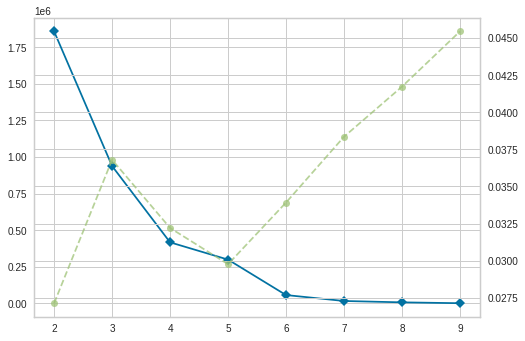

In [52]:
# Elbow method to select the most appropiate number of clusters
# model      = KMeans()
visualizer = KElbowVisualizer(KMeans(), k=(2,10))

visualizer.fit(sanjoseclustering_pop)        # Fit the data to the visualizer
visualizer                          # Finalize and render the figure

In [53]:
# Number of clusters for population
kclusters = 4

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(sanjoseclustering_pop)
# check cluster labels generated for each row in the dataframe
print('{} cluster conf for {} clusters'.format(kmeans.labels_,kclusters))

councils_data['clustering_pop'] = kmeans.labels_
councils_data

[2 0 1 0 3 1 2 0 1 0] cluster conf for 4 clusters


,district,number,population,housing_units,square_miles,pop_density,pop_per_house,center_lat,center_long,Restaurants,Healthy,Coffee,Hotel,clustering_pop
0,1,1,95817,36182,9.72,9857.716049,2.648195,37.296437,-121.985280,81.0,34.0,24.0,2.0,2
1,2,2,91379,28681,43.54,2098.736794,3.186047,37.246494,-121.775911,59.0,54.0,15.0,3.0,0
2,3,3,97003,34021,13.05,7433.180077,2.851268,37.355579,-121.894108,198.0,72.0,53.0,18.0,1
3,4,4,99892,33047,40.62,2459.182669,3.022725,37.410730,-121.881324,98.0,61.0,48.0,9.0,0
4,5,5,97510,24263,17.01,5732.510288,4.018876,37.375417,-121.805657,71.0,18.0,11.0,1.0,3
5,6,6,91837,39181,12.22,7515.302782,2.343917,37.307389,-121.916346,132.0,76.0,49.0,5.0,1
6,7,7,99030,26793,11.16,8873.655914,3.696115,37.303184,-121.838462,133.0,33.0,48.0,5.0,2
7,8,8,97336,27363,72.81,1336.849334,3.557212,37.285814,-121.761826,77.0,35.0,29.0,0.0,0
8,9,9,90714,34212,12.49,7262.930344,2.651526,37.258634,-121.910227,92.0,50.0,32.0,1.0,1
9,10,10,92094,32033,47.34,1945.373891,2.874973,37.236517,-121.853606,88.0,62.0,30.0,2.0,0


### Clustering by district venues

In [0]:
sanjoseclustering_services = councils_data[['Restaurants', 'Healthy', 'Coffee', 'Hotel']].copy()

/usr/local/lib/python3.6/dist-packages/sklearn/base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


KElbowVisualizer(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7f91253278d0>,
                 k=None, metric=None, model=None, timings=True)

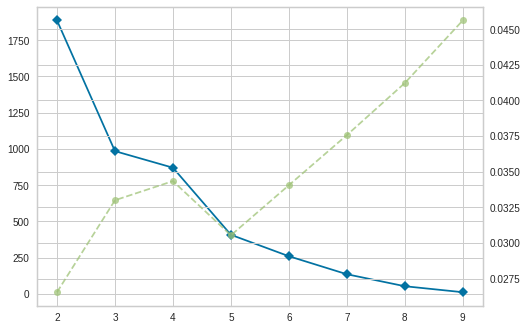

In [56]:
# Elbow method to select the most appropiate number of clusters
visualizer = KElbowVisualizer(KMeans(), k=(2,10))

visualizer.fit(sanjoseclustering_services)        # Fit the data to the visualizer
visualizer                                        # Finalize and render the figure

In [62]:
# Number of clusters for services
kclusters = 3

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(sanjoseclustering_services)
# check cluster labels generated for each row in the dataframe
print('{} cluster conf for {} clusters'.format(kmeans.labels_,kclusters))

councils_data['clustering_services'] = kmeans.labels_
councils_data

[2 2 1 0 2 0 0 2 2 2] cluster conf for 3 clusters


,district,number,population,housing_units,square_miles,pop_density,pop_per_house,center_lat,center_long,Restaurants,Healthy,Coffee,Hotel,clustering_pop,clustering_services,healthy/rest,coffee/rest,hotel/rest
0,1,1,95817,36182,9.72,9857.716049,2.648195,37.296437,-121.985280,81.0,34.0,24.0,2.0,2,2,0.419753,0.296296,0.024691
1,2,2,91379,28681,43.54,2098.736794,3.186047,37.246494,-121.775911,59.0,54.0,15.0,3.0,0,2,0.915254,0.254237,0.050847
2,3,3,97003,34021,13.05,7433.180077,2.851268,37.355579,-121.894108,198.0,72.0,53.0,18.0,1,1,0.363636,0.267677,0.090909
3,4,4,99892,33047,40.62,2459.182669,3.022725,37.410730,-121.881324,98.0,61.0,48.0,9.0,0,0,0.622449,0.489796,0.091837
4,5,5,97510,24263,17.01,5732.510288,4.018876,37.375417,-121.805657,71.0,18.0,11.0,1.0,3,2,0.253521,0.154930,0.014085
5,6,6,91837,39181,12.22,7515.302782,2.343917,37.307389,-121.916346,132.0,76.0,49.0,5.0,1,0,0.575758,0.371212,0.037879
6,7,7,99030,26793,11.16,8873.655914,3.696115,37.303184,-121.838462,133.0,33.0,48.0,5.0,2,0,0.248120,0.360902,0.037594
7,8,8,97336,27363,72.81,1336.849334,3.557212,37.285814,-121.761826,77.0,35.0,29.0,0.0,0,2,0.454545,0.376623,0.000000
8,9,9,90714,34212,12.49,7262.930344,2.651526,37.258634,-121.910227,92.0,50.0,32.0,1.0,1,2,0.543478,0.347826,0.010870
9,10,10,92094,32033,47.34,1945.373891,2.874973,37.236517,-121.853606,88.0,62.0,30.0,2.0,0,2,0.704545,0.340909,0.022727


In [63]:
councils_data['healthy/rest'] =  councils_data['Healthy']/councils_data['Restaurants']
councils_data['coffee/rest']  =  councils_data['Coffee']/councils_data['Restaurants']
councils_data['hotel/rest']   =  councils_data['Hotel']/councils_data['Restaurants']

councils_data

,district,number,population,housing_units,square_miles,pop_density,pop_per_house,center_lat,center_long,Restaurants,Healthy,Coffee,Hotel,clustering_pop,clustering_services,healthy/rest,coffee/rest,hotel/rest
0,1,1,95817,36182,9.72,9857.716049,2.648195,37.296437,-121.985280,81.0,34.0,24.0,2.0,2,2,0.419753,0.296296,0.024691
1,2,2,91379,28681,43.54,2098.736794,3.186047,37.246494,-121.775911,59.0,54.0,15.0,3.0,0,2,0.915254,0.254237,0.050847
2,3,3,97003,34021,13.05,7433.180077,2.851268,37.355579,-121.894108,198.0,72.0,53.0,18.0,1,1,0.363636,0.267677,0.090909
3,4,4,99892,33047,40.62,2459.182669,3.022725,37.410730,-121.881324,98.0,61.0,48.0,9.0,0,0,0.622449,0.489796,0.091837
4,5,5,97510,24263,17.01,5732.510288,4.018876,37.375417,-121.805657,71.0,18.0,11.0,1.0,3,2,0.253521,0.154930,0.014085
5,6,6,91837,39181,12.22,7515.302782,2.343917,37.307389,-121.916346,132.0,76.0,49.0,5.0,1,0,0.575758,0.371212,0.037879
6,7,7,99030,26793,11.16,8873.655914,3.696115,37.303184,-121.838462,133.0,33.0,48.0,5.0,2,0,0.248120,0.360902,0.037594
7,8,8,97336,27363,72.81,1336.849334,3.557212,37.285814,-121.761826,77.0,35.0,29.0,0.0,0,2,0.454545,0.376623,0.000000
8,9,9,90714,34212,12.49,7262.930344,2.651526,37.258634,-121.910227,92.0,50.0,32.0,1.0,1,2,0.543478,0.347826,0.010870
9,10,10,92094,32033,47.34,1945.373891,2.874973,37.236517,-121.853606,88.0,62.0,30.0,2.0,0,2,0.704545,0.340909,0.022727


Interpretation of clusters:  
Clustering about population (clustering_pop):
- 0 -> Low density, big areas, pop per house around 3
- 1 -> Medium to high pop_density, pop per house 2.7
- 2 -> Highest population densities
- 3 -> Top population per house, top Family neighborhood

Clustering about services (Clustering_services):
- 0 -> Intermediate number of categorised services
- 1 -> Highest number of categorised services
- 2 -> Lowest number of categorised services

Preparation of the data to create bar plot of number of services per inhabitant in every district

In [59]:
# Copy of the councils_data dataframe
nserperperson = councils_data[['district','Restaurants','Healthy','Coffee','Hotel']].copy()

# Services per every 1000 inhabitants
nserperperson['Restaurants'] = councils_data['Restaurants']/councils_data['population']*1000
nserperperson['Healthy']     = councils_data['Healthy']/councils_data['population']*1000
nserperperson['Coffee']      = councils_data['Coffee']/councils_data['population']*1000
nserperperson['Hotel']       = councils_data['Hotel']/councils_data['population']*1000

# Change of index, transpose and display
nserperperson.set_index('district', inplace=True)
nserperperson = nserperperson.transpose()
nserperperson['Ave'] = [nserperperson.iloc[0].mean(),nserperperson.iloc[1].mean(),nserperperson.iloc[2].mean(),nserperperson.iloc[3].mean()]
nserperperson

district,1,2,3,4,5,6,7,8,9,10,Ave
Restaurants,0.845361,0.645663,2.041174,0.981060,0.728130,1.437329,1.343027,0.791074,1.014176,0.955545,1.078254
Healthy,0.354843,0.590945,0.742245,0.610660,0.184596,0.827553,0.333232,0.359579,0.551183,0.673225,0.522806
Coffee,0.250477,0.164152,0.546375,0.480519,0.112809,0.533554,0.484702,0.297937,0.352757,0.325754,0.354904
Hotel,0.020873,0.032830,0.185561,0.090097,0.010255,0.054444,0.050490,0.000000,0.011024,0.021717,0.047729


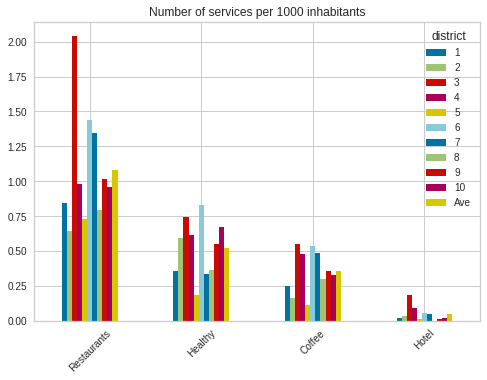

In [60]:
ax = nserperperson.plot.bar(rot=45, title='Number of services per 1000 inhabitants')

San José has more restaurants than any other categorised venu. It has twice more restaurants than healthy places, three times more than coffee shops and 22 times more than hotels.  
In general terms the district with more services per inhhabitant is 3 corresponding with the city centre and where the airport is located.  
District 6 is the second with more services. It is strategically located to the south-west of 3, but very close to the airport as well.  
The District with the least number of services is number 2, located in the south, covering the US 101 to Morgan Hill.



---


## Discussion

In [61]:
print('San José has a population of {} inhabitants and covers an area of {:.2f} m^2'.format(councils_data['population'].sum(),councils_data['square_miles'].sum()))

San José has a population of 952612 inhabitants and covers an area of 279.96 m^2


San José is divided into 10 districts. Districts 3, 6 and 7 are the city centre. In the north, district 4 limits with the bay of San Francisco. In the west district 1 limits with Cupertino and Saratoga. East Districts (5,8), limit with the mountains. Districts 2, 9 y 10 are the south districts.  
San José has a population shortly below one million inhabitants over an area of 280 $mi^2$. Its population is quite uniformily distribuited in the 10 districts with roughly 95000 inhhabitants each.  
It presents a population density from 7000 innhabitants per $mi^2$ in its smallest districts (centre and east mainly). Districts in the north and south of the city have a population density below 3000.  
Innhabitants per house ranges from 2.4 to 4. The highest number corresponds with district 5, in the east side of the city. This seems to be a familiar district. The surroundings of the city has the highest values of innhabitants per house. Probably due to lower house prices than the city centre, that allow building bigger houses.  
KMeans clustering algorithm considers district 5 as a category on its own because of the high population per house. Then districts 1 and 7 with the highest population density. Districts 3, 6 and 9 forms another group with medium to high population density. The rest are considered as low population density areas.
Regarding services, according to foursquare, districts 3, 6 and 7 has more than 100 each, hitting a peak in the city centre (district 3) with 158. The rest of districts have a number below 80 and pretty uniform.  
Healthy places including parks, skateparks, gyms, etc. present a roughly uniform distribution except for district 5 with the lowest number being 13.  
Coffee and dessert places are more uniformly distributed than restaurants, but still mainly concentrated in the city centre.  
Hotels are mainly present in districts 3 (city centre) and 4 (north of the city).  
In general terms the district with more services is 3, followed by 6. In agreement with the clustering technique, district 3 is a category of its own. Then 4, 6 and 7 have an intermediate number of services. The rest are categorised as low number of services by KMeans algorithm. With this information in mind, and with no access to more accurate geographic or any type of economic data I will recommend placing services as follows:
- **Restaurants**: If the proposal of the restaurant is stellar or if it is an outstanding cuisine, the best district is 3 for its highest population density, the presence of the airport and the convenient proximity of other services. In case of a familiar restaurant, I will chose district 5, because of its highest number of innhabitants per house and low number of other restaurants there. Additionally it will probably be a cheaper place than in the city centre.
- **Healthy place**: Healthy places are more uniformly distributed except for districts 5 and 8. In case of looking for reducing the competence, these will be the recommendation.
- **Coffee/desert places**: Although 3, 6 and 7 are the districts with more coffee shops, I would still recommend those districts adding district 1. I think the most important thing for a coffee shop is population density. Having some food is a thing you normally plan more than having a coffee. 
- **Hotels**: For placing a hotel, I will skip the city centre because of the high number of them already there. In case of a business hotel, I would go for districts 1, 6 and 7, that limit with district 3. If it is a hotel for relaxing, then one of the surrounding areas, mainly in the south due to the low population density and low competence there. 






---


## Conclusion

San José is strategically located in the heart of Silicon Valley, where a lot of hi-tech activity is going on. The city centre of San José corresponds with district 3. This is the neuralcentre of the city, with an airport, the highest population density and number of services. Any businesses placed there need to be quite special to stand out of the competition.  
Districts 1, 6 and 7 present a great opportunity for many businesses as they close to the centre or closer to other places like Cupertino (district 1) and they have less services than the city centre.  
Services focused on families should select district 5, because the high population per house (4) there.  
Surrounding districts, mainly the ones in the south has less activity, but they can be good places for other type of activities, mainly relaxing or nature based.

This study has been developed based on the data of the San José government and the venues included in FourSquare webservice.
